In [1]:
# Import necessary packages

import numpy as np
import torch 
import torch.nn as nn 
import pandas as pd
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import os 
from sklearn.model_selection import train_test_split
import random
from sklearn.preprocessing import normalize
import torch.nn.functional as F
import matplotlib.pyplot as plt

In [2]:
# Navigate to directory that stores all the files - will need to be changed for each person running this script
os.chdir('/home/ian/Documents/Penn_Fall_2020/CIS_519/CIS 519 Audio Classification Project Local Files')
os.getcwd()

'/home/ian/Documents/Penn_Fall_2020/CIS_519/CIS 519 Audio Classification Project Local Files'

In [3]:
# Reload features (takes a couple minutes)
# features = np.load('features_with_gender.npy',allow_pickle=True)
features = np.load('features_chromagram.npy',allow_pickle=True)

In [4]:
# Changing array type of features (Necessary for it to work with pytorch)

features = [example for example in features]

In [5]:
features

[array([[4.24552692e-01, 5.13802568e-01, 3.32802442e-01, 4.79972671e-01,
         5.55304296e-01, 3.55334091e-01, 1.83285032e-01, 1.79071276e-01,
         2.80902192e-01, 3.00514383e-01, 3.16979093e-02, 4.84485051e-02,
         4.34622176e-02, 3.13574314e-02, 6.58317880e-02, 1.23337060e-02,
         1.16730476e-02, 2.78863892e-02, 4.04677939e-02, 2.96072961e-03,
         9.08081046e-04, 3.96429208e-03, 6.82173516e-02, 1.31307522e-02,
         2.77373636e-02, 3.77568708e-01, 4.14487918e-01, 4.31786779e-02,
         7.76504252e-02, 1.60105425e-01, 4.82443459e-02, 3.97071948e-02,
         2.53468062e-01, 8.18693412e-02, 7.48345282e-02, 8.66856884e-02,
         6.47219759e-02, 1.42495204e-01, 9.34266178e-02, 1.04011944e-01,
         5.35296110e-02, 4.02459566e-01, 1.00000000e+00, 6.25130756e-01,
         1.44263727e-01, 3.07776856e-01, 3.76477572e-01],
        [9.03145089e-01, 9.32607132e-01, 7.59990405e-01, 9.84510195e-01,
         5.72799824e-01, 5.62383592e-01, 6.89455820e-01, 6.7140342

In [6]:
# Load in labels 
labels = np.load('labels.npy', allow_pickle=True)

In [7]:
# Load in gender
gender=np.load('gender.npy',allow_pickle=True)

In [8]:
# Turn labels into numeric values, create dictionary to map back later 

labels_unique = np.unique(labels)
labels_dict = {}
for i in range (0, len(labels_unique)):
    labels_dict.update({i:labels_unique[i]})

labels_dict_reversed = {value:key for key, value in labels_dict.items()}

def label_to_num(x):
    return labels_dict_reversed[x]

labels_numeric = [label_to_num(country) for country in labels]

#### Split into train and test sets: ZERO-SHOT

In [9]:
features_male = []
labels_male = []
features_female = []
labels_female = []

for i in range(len(gender)):
    if gender[i] == 0:
        features_male.append(features[i])
        labels_male.append(labels[i])
    else:
        features_female.append(features[i])
        labels_female.append(labels[i])
        
features_male = np.array(features_male)
features_female = np.array(features_female)
labels_male = np.array(labels_male)
labels_female = np.array(labels_female)

In [10]:
# Get train and test datasets
x_train, x_valid, y_train, y_valid = train_test_split(features_male, labels_male, test_size=0.3, random_state=42)
_, x_test, _, y_test = train_test_split(features_female, labels_female, test_size=0.3, random_state=142)

In [11]:
# Balance training data 

for y in labels_unique:
    print(str(y) + ' , Occurences: ' + str(list(labels).count(y)))
    
x_train_balanced = []
x_valid_balanced = []
y_train_balanced = []
y_valid_balanced = []
x_test_balanced = []
y_test_balanced = []

remap={}
keep = [0,1,6,7,8,12,13,18,19]

for i in range(0, len(keep)):
    remap[keep[i]] = i
    
print(remap)

    
for i in range(0, len(y_train)):
    if y_train[i] in keep:
        y_train_balanced.append(remap[y_train[i]])
        x_train_balanced.append(x_train[i])
        
for i in range(0, len(y_valid)):
    if y_valid[i] in keep:
        y_valid_balanced.append(remap[y_valid[i]])
        x_valid_balanced.append(x_valid[i])
        
for i in range(0, len(y_test)):
    if y_test[i] in keep:
        y_test_balanced.append(remap[y_test[i]])
        x_test_balanced.append(x_test[i])
        



0 , Occurences: 500
1 , Occurences: 500
2 , Occurences: 91
3 , Occurences: 188
4 , Occurences: 144
5 , Occurences: 141
6 , Occurences: 500
7 , Occurences: 500
8 , Occurences: 500
9 , Occurences: 274
10 , Occurences: 392
11 , Occurences: 159
12 , Occurences: 500
13 , Occurences: 500
14 , Occurences: 243
15 , Occurences: 118
16 , Occurences: 88
17 , Occurences: 292
18 , Occurences: 500
19 , Occurences: 500
{0: 0, 1: 1, 6: 2, 7: 3, 8: 4, 12: 5, 13: 6, 18: 7, 19: 8}


In [12]:
# Initializing number of outputs for neural network

output_label_num = len(labels_unique)

In [13]:
output_label_num

20

In [14]:
# Convolutional 

class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv1d(in_channels=12,out_channels=30, kernel_size=2)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv1d(in_channels=30,out_channels=50, kernel_size=2)
        self.fc1 = nn.Linear(25*22, 200)
        self.fc2 = nn.Linear(200, 100)
        self.fc3 = nn.Linear(100, output_label_num)
        self.dropout = nn.Dropout(p=.3)

    def forward(self, x):
#         x = self.pool(F.relu(self.conv1(x)))
        x = F.relu(self.conv1(x))
        x = self.pool(F.relu(self.conv2(x)))
#         print(x.size())
        x = x.view(-1, 1*x.size()[1]*x.size()[2])
#         print(x.size())
        x = self.dropout(x)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x
    
class BalancedNet(nn.Module):
    def __init__(self):
        super(BalancedNet, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=1,out_channels=10,kernel_size=3,stride=1,padding=0)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(in_channels=10,out_channels=15,kernel_size=3,stride=1,padding=0)
        self.fc1 = nn.Linear(15*254*10*1, 300)
        self.fc2 = nn.Linear(300, 100)
        self.fc3 = nn.Linear(100, len(keep))
        self.dropout = nn.Dropout(p=.3)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
#         x = self.dropout(x)
        x = self.pool(F.relu(self.conv2(x)))
#         x = self.dropout(x)
        x = x.view(-1, 1*x.size()[1]*x.size()[2]*x.size()[3])
        x = self.dropout(x)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x
    
    

In [15]:
def compute_loss_and_accuracy(network, data_loader):
    total_loss = 0
    num_correct = 0
    num_instances = 0

    cross_entropy_loss = torch.nn.CrossEntropyLoss()

    for X, y in data_loader:
        with torch.no_grad():
            y_pred = network(X)
            total_loss += cross_entropy_loss(y_pred,y).item() * X.size(0)

        for i in range(len(y_pred)):
            predicted = torch.argmax(y_pred[i])
            actual = y[i]

            if predicted == actual:
                num_correct += 1
                
        num_instances += X.size(0)
  
    accuracy = num_correct / num_instances
    average_loss = total_loss / num_instances

    return accuracy, average_loss

In [16]:
# Creating function to compute loss/accuracy

def test_model(net, test_dataloader):

    total_loss = 0
    total_classified_correct = 0
    total_attempted = 0
    pred_vs_actual = []

    criterion = nn.CrossEntropyLoss()

    for x, y in test_dataloader:
        output = net(x)
        _, predicted = torch.max(output, 1)
        loss = criterion(output, y)
        total_loss += loss.item()
        total_classified_correct += (predicted==y).sum().item()
        total_attempted += len(predicted)
        pred_vs_actual.append((predicted.item(), y.item()))
        
    print('Test Average Loss: ' + str(total_loss/total_attempted))
    print('Test Accuracy: ' + str(total_classified_correct/total_attempted))
    
    
    return total_attempted, pred_vs_actual

In [17]:
def check_preds(pred_vs_acc):
    pred_list = []
    acc_list = []
    total_list = []
    for pred, acc in pred_vs_acc:
        pred_list.append(pred)
        acc_list.append(acc)
        total_list.append(1)
        
    df = pd.DataFrame({'predicted':pred_list, 'actual':acc_list, 'total':total_list})
    df = df.groupby(['predicted', 'actual']).count().reset_index()
    
    def get_correct(row):
        if row.predicted==row.actual:
            return 1 
        else:
            return 0
        
    df['is_correct'] = df.apply(lambda x: get_correct(x), axis=1)
    df['predicted_country'] = df.predicted.apply(lambda x: labels_dict[x])
    df['actual_country'] = df.actual.apply(lambda x: labels_dict[x])
    
    return df

In [18]:
# Creating training function

def train_model(epochs, net, train_dataloader, valid_dataloader, optimizer, criterion):

    train_loss_per_epoch = []
    train_acc_per_epoch = []
    valid_acc_per_epoch = []

    for epoch in range (0, epochs):

        train_total_loss = 0
        train_total_correct = 0
        train_total_attempted = 0

        for x, y in train_dataloader:
            optimizer.zero_grad()
            output = net(x)
            _, predicted = torch.max(output, 1)
            loss = criterion(output, y)
            loss.backward()
            optimizer.step()
        
        train_acc, train_loss = compute_loss_and_accuracy(net, train_dataloader)
        valid_acc, valid_loss = compute_loss_and_accuracy(net, valid_dataloader)
        
        train_loss_per_epoch.append(train_loss)
        train_acc_per_epoch.append(train_acc)
        valid_acc_per_epoch.append(valid_acc)

    
        print('Epoch ' + str(epoch) + ':')
        print('Train Average Loss: ' + str(train_loss))
        print('Train Accuracy: ' + str(train_acc))
        print('Validation Average Loss: ' + str(valid_loss))
        print('Validation Accuracy: ' + str(valid_acc))
        print()


    return train_acc_per_epoch, valid_acc_per_epoch

# train_model(1, net, train_dataloader, optimizer, criterion)

In [19]:
# Create dataloader objects, move to GPU

batch = 32

# Train
x_train_tensor = torch.tensor(x_train, dtype=torch.float)
# x_train_tensor = x_train_tensor.unsqueeze(dim=1)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)

x_train_tensor = x_train_tensor.cuda()
y_train_tensor = y_train_tensor.cuda()

train_dataset = TensorDataset(x_train_tensor, y_train_tensor)
train_dataloader = DataLoader(train_dataset, batch_size=batch)

# Validation
x_valid_tensor = torch.tensor(x_valid, dtype=torch.float)
# x_valid_tensor = x_valid_tensor.unsqueeze(dim=1)
y_valid_tensor = torch.tensor(y_valid, dtype=torch.long)

x_valid_tensor = x_valid_tensor.cuda()
y_valid_tensor = y_valid_tensor.cuda()

valid_dataset = TensorDataset(x_valid_tensor, y_valid_tensor)
valid_dataloader = DataLoader(valid_dataset, batch_size=batch)

# Test
x_test_tensor = torch.tensor(x_test, dtype=torch.float)
# x_test_tensor = x_test_tensor.unsqueeze(dim=1)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

x_test_tensor = x_test_tensor.cuda()
y_test_tensor = y_test_tensor.cuda()

test_dataset = TensorDataset(x_test_tensor, y_test_tensor)
test_dataloader = DataLoader(test_dataset, batch_size=1)


Epoch 0:
Train Average Loss: 2.8748029968798807
Train Accuracy: 0.09855595667870036
Validation Average Loss: 2.877673788102789
Validation Accuracy: 0.11784511784511785

Epoch 1:
Train Average Loss: 2.7654237907285726
Train Accuracy: 0.11010830324909747
Validation Average Loss: 2.7675412889281508
Validation Accuracy: 0.09764309764309764

Epoch 2:
Train Average Loss: 2.7578925695660312
Train Accuracy: 0.11010830324909747
Validation Average Loss: 2.7585060556328256
Validation Accuracy: 0.09764309764309764

Epoch 3:
Train Average Loss: 2.7560315369698976
Train Accuracy: 0.11010830324909747
Validation Average Loss: 2.7569180032620926
Validation Accuracy: 0.09764309764309764

Epoch 4:
Train Average Loss: 2.753726364989573
Train Accuracy: 0.11010830324909747
Validation Average Loss: 2.7537859489620735
Validation Accuracy: 0.09764309764309764

Epoch 5:
Train Average Loss: 2.7509377458896016
Train Accuracy: 0.11010830324909747
Validation Average Loss: 2.7525429886198203
Validation Accuracy: 0.0

Epoch 49:
Train Average Loss: 2.606710472175791
Train Accuracy: 0.1711191335740072
Validation Average Loss: 2.732448630862766
Validation Accuracy: 0.117003367003367

Epoch 50:
Train Average Loss: 2.606246929822846
Train Accuracy: 0.17184115523465704
Validation Average Loss: 2.735762869067465
Validation Accuracy: 0.12542087542087543

Epoch 51:
Train Average Loss: 2.6060975529226584
Train Accuracy: 0.16859205776173286
Validation Average Loss: 2.7323297121709444
Validation Accuracy: 0.11531986531986532

Epoch 52:
Train Average Loss: 2.6051095389286965
Train Accuracy: 0.16534296028880865
Validation Average Loss: 2.7337976128163963
Validation Accuracy: 0.11784511784511785

Epoch 53:
Train Average Loss: 2.599846646415628
Train Accuracy: 0.17220216606498195
Validation Average Loss: 2.746341459678881
Validation Accuracy: 0.11026936026936027

Epoch 54:
Train Average Loss: 2.593959510713708
Train Accuracy: 0.17148014440433212
Validation Average Loss: 2.73763091957529
Validation Accuracy: 0.12457

Epoch 98:
Train Average Loss: 2.453906630781153
Train Accuracy: 0.21191335740072204
Validation Average Loss: 2.8010371774936766
Validation Accuracy: 0.117003367003367

Epoch 99:
Train Average Loss: 2.4424460037520648
Train Accuracy: 0.2184115523465704
Validation Average Loss: 2.8159229923980407
Validation Accuracy: 0.1127946127946128



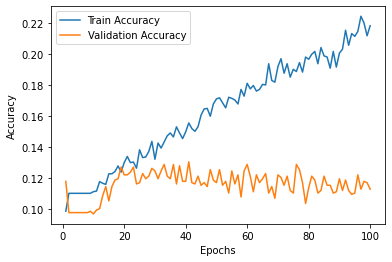

In [26]:
# Initializing model, parameters, move to GPU

net = Net()
net = net.cuda()

optimizer = optim.Adam(net.parameters(), lr=0.0001)
criterion = nn.CrossEntropyLoss()

# Train Model
epochs = 100
train_accs, valid_accs = train_model(epochs, net, train_dataloader, valid_dataloader, optimizer, criterion)

epoch_list = [i for i in range(1, epochs+1)]
plt.figure()
plt.plot(epoch_list, train_accs, label='Train Accuracy')
plt.plot(epoch_list, valid_accs, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [27]:
pred_vs_acc = test_model(net, test_dataloader)[1]

Test Average Loss: 3.5498630591758764
Test Accuracy: 0.04488778054862843


In [22]:
check_preds(pred_vs_acc)[check_preds(pred_vs_acc)['is_correct']==1].sort_values(by='total', ascending=False)

,predicted,actual,total,is_correct,predicted_country,actual_country
110,12,12,6,1,12,12
172,19,19,6,1,19,19
87,10,10,5,1,10,10
0,0,0,3,1,0,0
131,13,13,3,1,13,13
156,18,18,3,1,18,18
19,1,1,2,1,1,1
38,6,6,2,1,6,6
52,7,7,2,1,7,7
68,8,8,2,1,8,8


In [23]:
check_preds(pred_vs_acc)[check_preds(pred_vs_acc)['is_correct']==0].sort_values(by='total', ascending=False)

,predicted,actual,total,is_correct,predicted_country,actual_country
105,12,7,27,0,12,7
107,12,9,26,0,12,9
115,12,17,24,0,12,17
117,12,19,20,0,12,19
99,12,1,19,0,12,1
...,...,...,...,...,...,...
134,13,16,1,0,13,16
96,11,16,1,0,11,16
34,6,1,1,0,6,1
138,15,0,1,0,15,0
